<a href="https://colab.research.google.com/github/GalRabin/ANPR/blob/main/ANPR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Automatic License/Number Plate Recognition (ANPR)

## Dependencies

In [12]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


In [13]:
!pip install opencv-python opencv-contrib-python pytesseract tesseract imutils scikit-image

In [14]:
!python -V

Python 3.7.10


In [15]:
!git clone https://github.com/GalRabin/ANPR.git 

fatal: destination path 'ANPR' already exists and is not an empty directory.


## Imports

In [16]:
from skimage.segmentation import clear_border
import pytesseract
import numpy as np
import imutils
import cv2
from google.colab.patches import cv2_imshow
import re
from matplotlib import pyplot as plt
from typing import List

## Helpers

In [20]:
##############################
####### Global variables #########
##############################

IMG1 = "/content/ANPR/data/base1.png"
IMG2 = "/content/ANPR/data/base2.png"
IMG3 = "/content/ANPR/data/base3.png"

#################################
####### Notebook initializations #######
#################################

%matplotlib inline


##############################
####### Share OCR model #######
##############################


class OCR:
    def __init__(self, regex_chars: str):
        """ Optical character recognition model.

        Args:
            regex_chars: Regex pattern of allowed character inside a license plate.
        """
        self._psm = 8
        self._regex_chars = regex_chars

    def extract(self, license_plate: np.ndarray) -> str:
        """ Extract characters from image.

        Args:
            license_plate: License plate image.

        Returns:
            str: license plate characters after extraction.
        """
        license_plate_text_filter = ""
        if type(license_plate) == np.ndarray:
          alphanumeric = "ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"
          options = "-c tessedit_char_whitelist={}".format(alphanumeric)
          options += " --psm {}".format(self._psm)
          license_plate_text = pytesseract.image_to_string(license_plate, config=options)
          license_plate_text_filter = re.sub(self._regex_chars, "", license_plate_text)

        return license_plate_text_filter


################################
####### Helper functions #######
################################

def debug_imshow(image: np.ndarray, title: str = "", debug: bool = False):
    """ Show image when debug mode is on.

    Args:
        image: The image to display.
        title: Image title.
        debug: True if in debug mode else False.
    """
    if debug:
        print(f'\033[1m\x1b[31m{title}:\x1b[0m')
        cv2_imshow(image)
        print('\n'*2)


def evaluate(img_name: str, solution: type, regex_pattern: str, minAR: int = None, maxAR: int = None, debug: bool = True):
    """ Evaluate license plate locator.

    Args:
        img_name: image file name which will be use in the evaluation.
        solution: Solution reference (e.g. First.. Second..)
        regex_pattern: Regex pattern of allow characters.
        minAR: Minimum aspect ratio of license plate.
        maxAR: Minimum aspect ratio of license plate.
        debug: True if in debug mode else False.
    """
    if minAR or maxAR:
      license_plate_locator_model = solution(img_name, minAR, maxAR, debug=debug)
    else:
      license_plate_locator_model = solution(img_name, debug=debug)
    ocr_model = OCR(regex_pattern)
    licence_plate_img = license_plate_locator_model.locate()
    licence_plate_text = ocr_model.extract(licence_plate_img)
    print(f'\033[1m\x1b[31mOCR output:\x1b[0m {licence_plate_text}')

## First solution

### Implementation

In [21]:
class FirstLicencePlateLocator:
    def __init__(self, img: str, minAR: int = 4, maxAR: int = 5, debug: bool = True):
        """ Detect license plate location in the image

        Args:
          img: Image path to extract license plate from.
          minAR: The minimum aspect ratio used to detect and filter rectangular license plates, which has a default value of 4.
          maxAR: The maximum aspect ratio of the license plate rectangle, which has a default value of 5.
          debug: A flag to indicate whether we should display intermediate results in our image processing pipeline.
        """
        self.img_rgb = cv2.imread(img)
        self.img_gray = cv2.cvtColor(self.img_rgb, cv2.COLOR_BGR2GRAY)
        self.minAR = minAR
        self.maxAR = maxAR
        self.debug = debug

    def _locate_license_plate_candidates(self, keep=5) -> List[np.ndarray]:
        """ Find the license plate candidate contours in an image

        Args:
          keep: Return up to this many sorted license plate candidate contours

        Return:
          list: Contours candidate.
        """
        debug_imshow(self.img_rgb, "Original image", self.debug)
        debug_imshow(self.img_gray, "Gray scale image", self.debug)
        # Perform a blackhat morphological operation that will allow us to reveal dark regions (i.e., text) on light backgrounds (i.e., the license plate itself).
        rectKern = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 5))
        blackhat = cv2.morphologyEx(self.img_gray, cv2.MORPH_BLACKHAT, rectKern)
        debug_imshow(blackhat , "Blackhat", self.debug)
        # Next, find regions in the image that are light.
        squareKern = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
        light = cv2.morphologyEx(self.img_gray, cv2.MORPH_CLOSE, squareKern)
        light = cv2.threshold(light, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        debug_imshow(light , "Light regions", self.debug)
        # Compute the Scharr gradient representation of the blackhat image in the x-direction and then scale the result back to the range [0, 255].
        gradX = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
        gradX = np.absolute(gradX)
        (minVal, maxVal) = (np.min(gradX), np.max(gradX))
        gradX = 255 * ((gradX - minVal) / (maxVal - minVal))
        gradX = gradX.astype("uint8")
        debug_imshow(gradX, "Grad x", self.debug)
        # Blur the gradient representation, applying a closing operation, and threshold the image using Otsu's method.
        gradX = cv2.GaussianBlur(gradX, (5, 5), 0)
        gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKern)
        thresh = cv2.threshold(gradX, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        debug_imshow(thresh , "Grad x after threshold", self.debug)
        # Perform a series of erosion and dilation to clean up the threshold image.
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)
        debug_imshow(thresh , "Grad x after threshold, erosion, dilation", self.debug)
        # Take the bitwise AND between the threshold result and the light regions of the image.
        thresh = cv2.bitwise_and(thresh, thresh, mask=light)
        thresh = cv2.dilate(thresh, None, iterations=2)
        thresh = cv2.erode(thresh, None, iterations=1)
        debug_imshow(thresh, "Bitwise and threshold", self.debug)
        # Find contours in the threshold image and sort them by their size in descending order, keeping only the largest ones.
        contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours = imutils.grab_contours(contours)
        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:keep]
        # Return the list of contours.
        return contours

    def _locate_license_plate(self, candidates: List[np.ndarray]) -> np.ndarray:
        """ Internal method - Locate license

        Args:
            candidates: License plate contour candidates.

        Returns:
            np.ndarray: Chosen candidate.
        """
        licensePlate = None
        # Loop over the license plate candidate contours
        for c in candidates:
            # Compute the bounding box of the contour and then use the bounding box to derive the aspect ratio.
            (x, y, w, h) = cv2.boundingRect(c)
            ar = w / float(h)
            # Check to see if the aspect ratio is rectangular
            if self.minAR <= ar <= self.maxAR:
                # Store the license plate contour and extract the license plate from the grayscale image and then threshold it
                licensePlate = self.img_gray[y:y + h, x:x + w]
                debug_imshow(licensePlate, "license plate", self.debug)
                break
        # Return found license plate.
        return licensePlate

    def locate(self) -> np.ndarray:
        """ Locate license plat in the image.
        
        Returns:
            np.ndarray: Sliced image of license plate
        """
        # convert the input image to grayscale, locate all candidate
        # license plate regions in the image, and then process the
        # candidates, leaving us with the *actual* license plate
        candidates = self._locate_license_plate_candidates()

        return self._locate_license_plate(candidates)

### Evaluation

#### Sample 1

Original image:


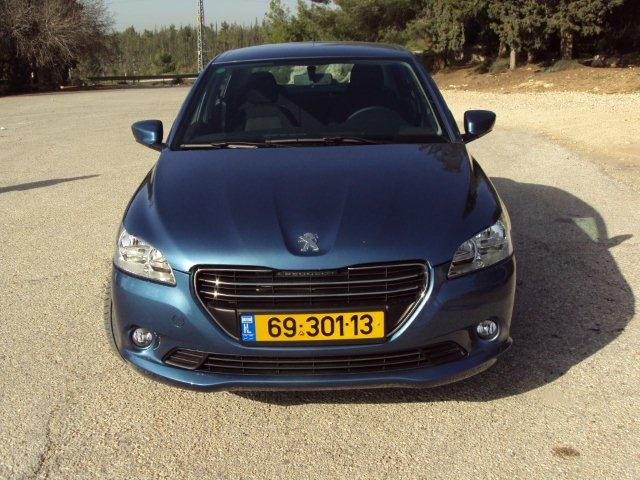




Gray scale image:


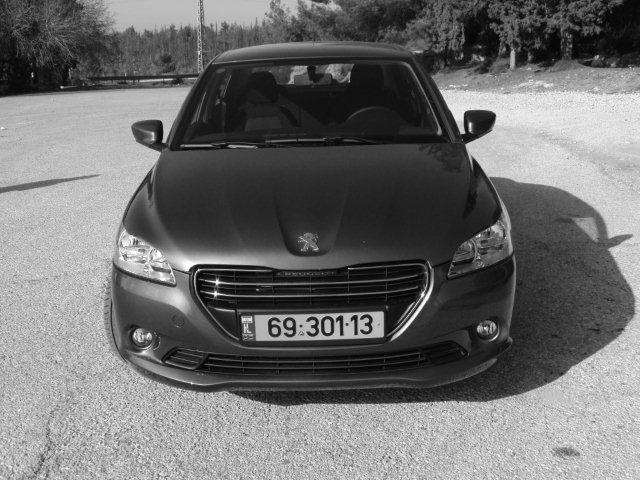




Blackhat:


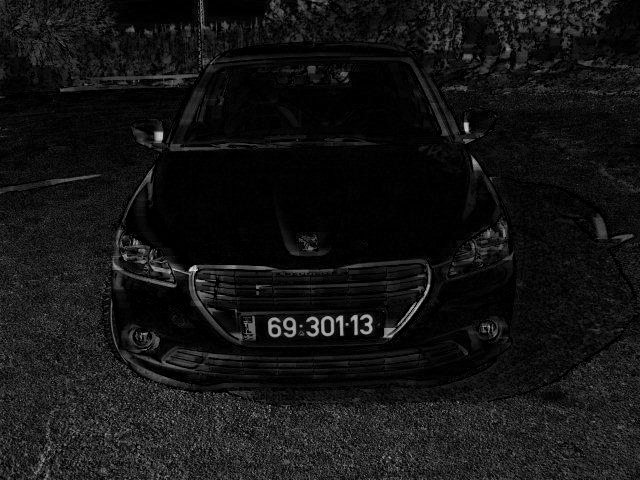




Light regions:


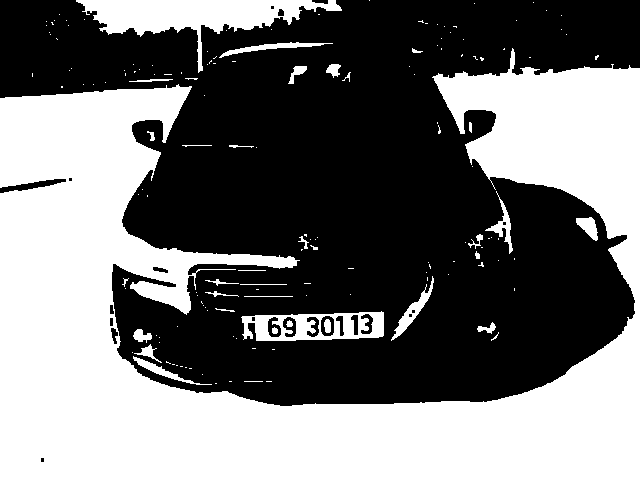




Grad x:


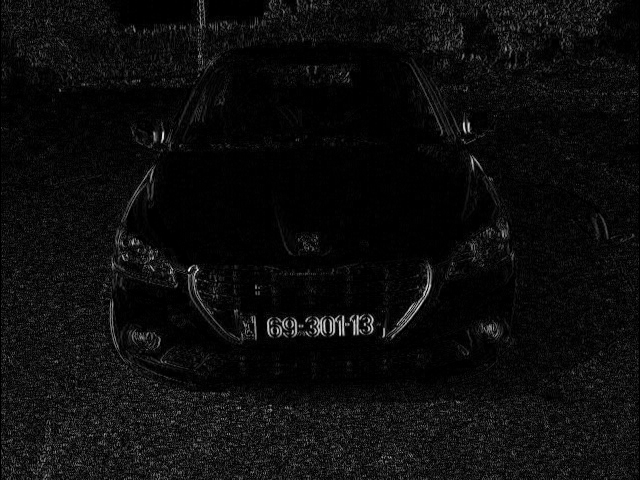




Grad x after threshold:


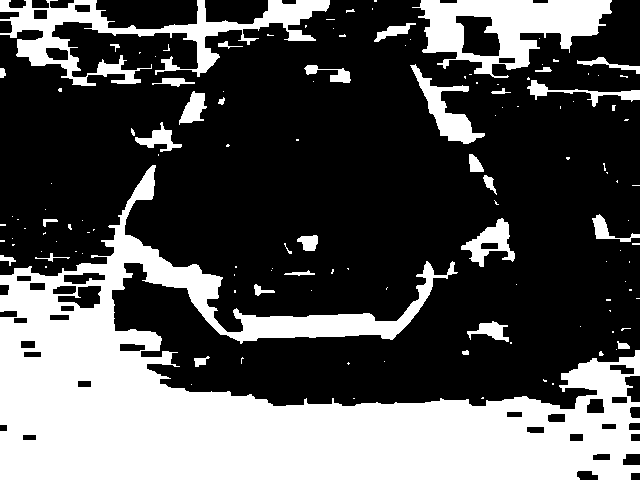




Grad x after threshold, erosion, dilation:


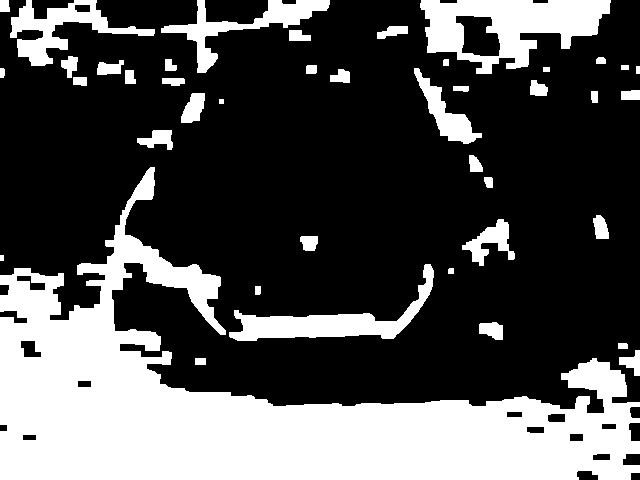




Bitwise and threshold:


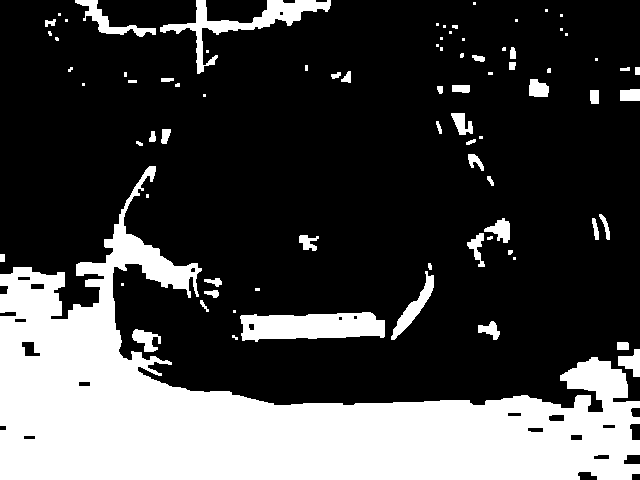




license plate:





OCR output: 6930113


In [22]:
evaluate(
    img_name=IMG1,
    solution=FirstLicencePlateLocator,
    minAR=4,
    maxAR=5,
    regex_pattern=r'[^0-9]',
    debug=True
)

#### Sample 2

Original image:


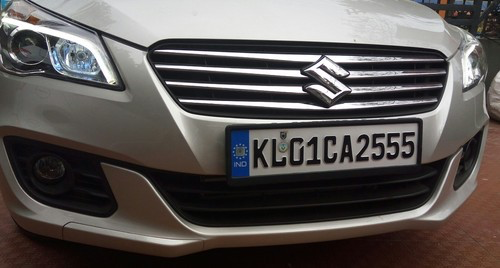




Gray scale image:


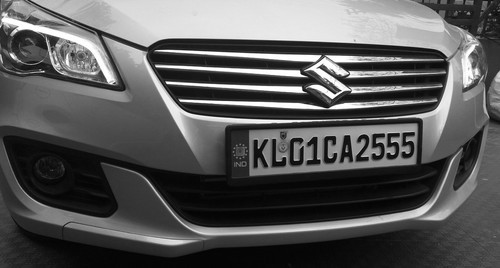




Blackhat:


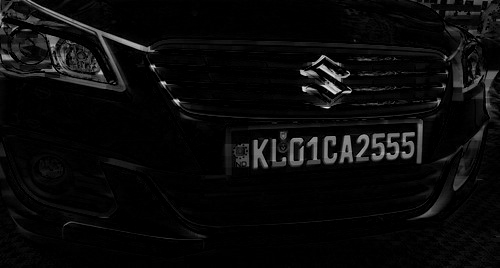




Light regions:


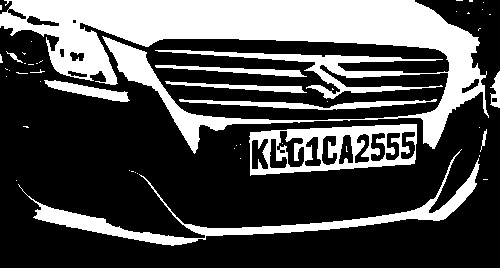




Grad x:


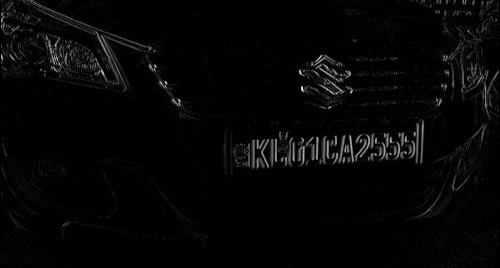




Grad x after threshold:


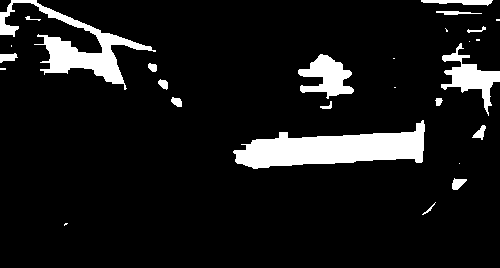




Grad x after threshold, erosion, dilation:


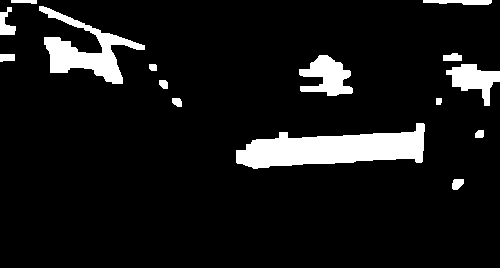




Bitwise and threshold:


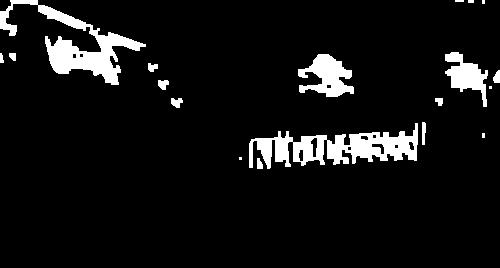




license plate:


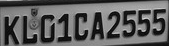




OCR output: KiG10A2555


In [23]:
evaluate(
    img_name=IMG2,
    solution=FirstLicencePlateLocator,
    minAR=2,
    maxAR=7,
    regex_pattern='[^a-zA-Z0-9]',
    debug=True
)

#### Sample 3

Original image:


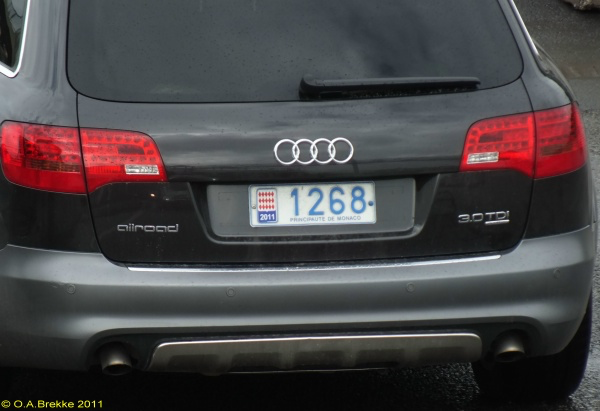




Gray scale image:


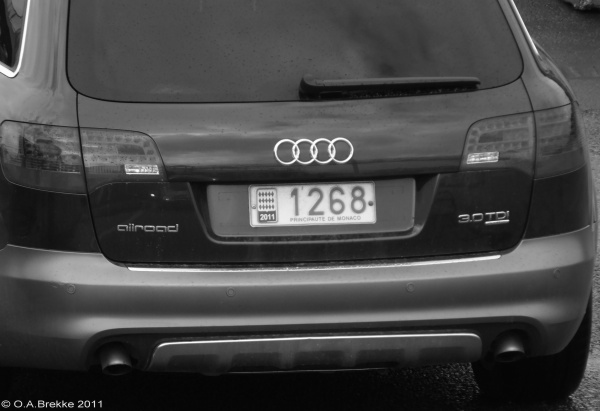




Blackhat:


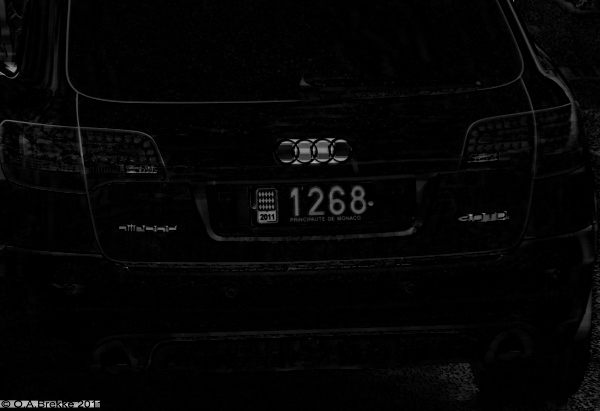




Light regions:


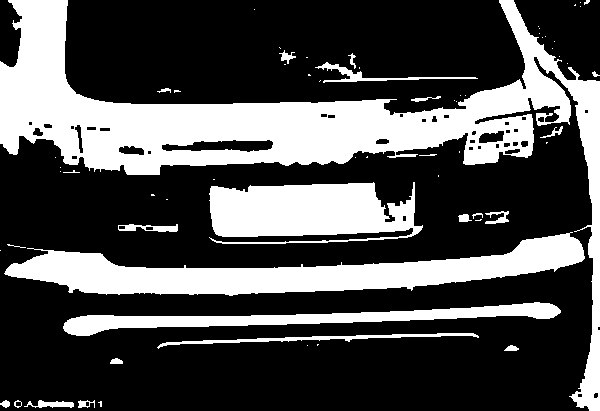




Grad x:


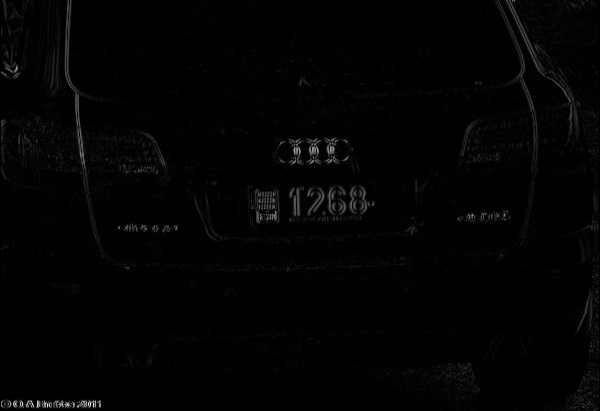




Grad x after threshold:


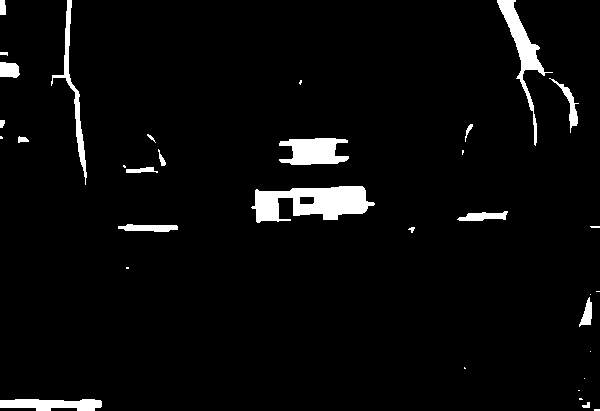




Grad x after threshold, erosion, dilation:


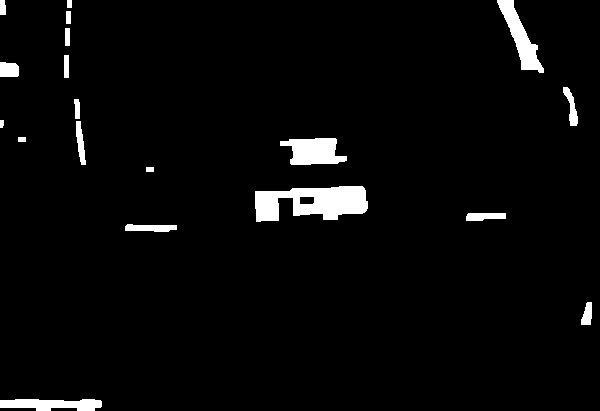




Bitwise and threshold:


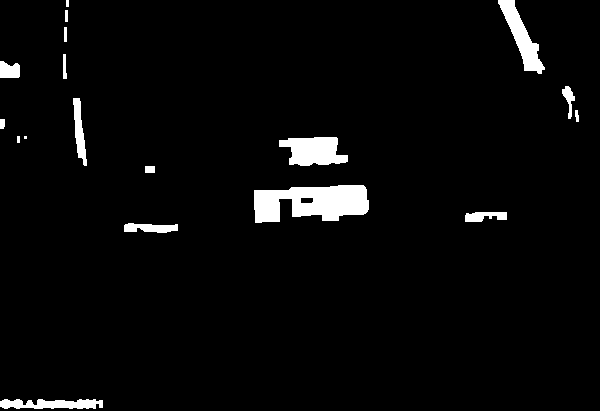




license plate:


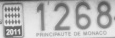




OCR output: 1266


In [24]:
evaluate(
    img_name=IMG3,
    solution=FirstLicencePlateLocator,
    minAR=2,
    maxAR=4,
    regex_pattern=r'[^0-9]',
    debug=True
)

## Second solution

### Implementation

In [25]:
class SecondLicencePlateLocator:
    def __init__(self, img: str, debug: bool = True):
        """ Detect license plate location in the image

        Args:
          img: Image path to extract license plate from.
          debug: A flag to indicate whether we should display intermediate results in our image processing pipeline.
        """
        # Resize the image to the required size and then grayscale it.
        self.img_rgb = cv2.resize(cv2.imread(img), (620, 480))
        self.img_gray = cv2.cvtColor(self.img_rgb, cv2.COLOR_BGR2GRAY)
        self.debug = debug

    def _locate_license_plate_candidates(self) -> List[np.ndarray]:
        """ Find the license plate candidate contours in an image

        Return:
          list: Contours candidate.
        """
        debug_imshow(self.img_rgb, "Original image", self.debug)
        debug_imshow(self.img_gray, "Gray scale image", self.debug)
        # Using a bilateral filter (Blurring) will remove the unwanted details from an image.
        self.img_gray = cv2.bilateralFilter(self.img_gray, 13, 15, 15)
        debug_imshow(self.img_gray, "Grey scale image - bilateral filter", self.debug)
        # Find edges in the image using canny edge detector.
        edged = cv2.Canny(self.img_gray, 30, 200)
        debug_imshow(edged, "Grey scale image - Canny edge detector", self.debug)
        #  Looking for contours candidates on our image and sort them by size.
        contours = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        contours = imutils.grab_contours(contours)
        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

        return contours

    def _locate_license_plate(self, candidates: List[np.ndarray]) -> np.ndarray:
        """ Internal method - Locate license

        Args:
            candidates: License plate contour candidates.

        Returns:
            np.ndarray: Chosen candidate.
        """
        screen_contour = None
        #  Loop over the license plate candidate contours.
        for c in candidates:
            # Approximate the contour.
            peri = cv2.arcLength(c, True)
            approx = cv2.approxPolyDP(c, 0.018 * peri, True)
            # If our approximated contour has four points, then we can assume that we have found our screen.
            if len(approx) == 4:
                screen_contour = approx
                break
        # Masking the part other than the number plate.
        mask = np.zeros(self.img_gray.shape, np.uint8)
        new_image = cv2.drawContours(mask, [screen_contour], 0, 255, -1, )
        new_image = cv2.bitwise_and(self.img_rgb, self.img_rgb, mask=mask)
        debug_imshow(new_image, "License plate", self.debug)
        # Crop only license plate from the image.
        (x, y) = np.where(mask == 255)
        (topx, topy) = (np.min(x), np.min(y))
        (bottomx, bottomy) = (np.max(x), np.max(y))
        cropped = self.img_rgb[topx:bottomx + 1, topy:bottomy + 1]
        debug_imshow(cropped, "Cropped license plate", self.debug)

        return cropped

    def locate(self) -> np.ndarray:
        """ Locate license plat in the image.

        Returns:
            np.ndarray: Sliced image of license plate
        """
        candidates = self._locate_license_plate_candidates()
        
        return self._locate_license_plate(candidates)

### Evaluation

#### Sample 1

Original image:


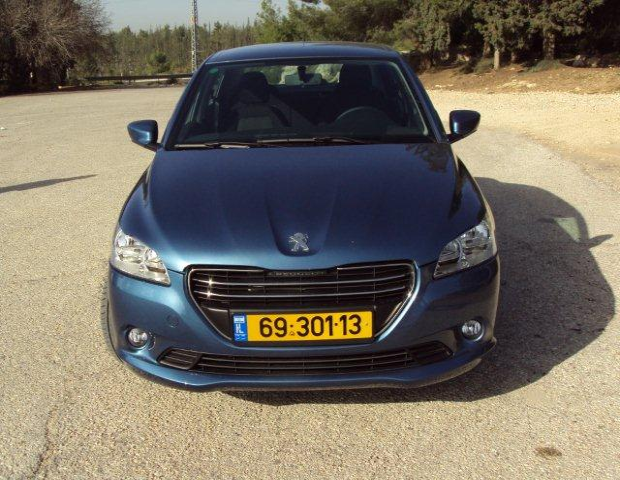




Gray scale image:


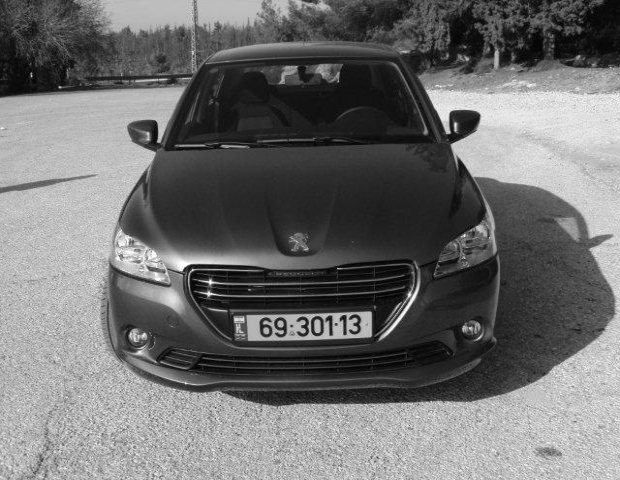




Grey scale image - bilateral filter:


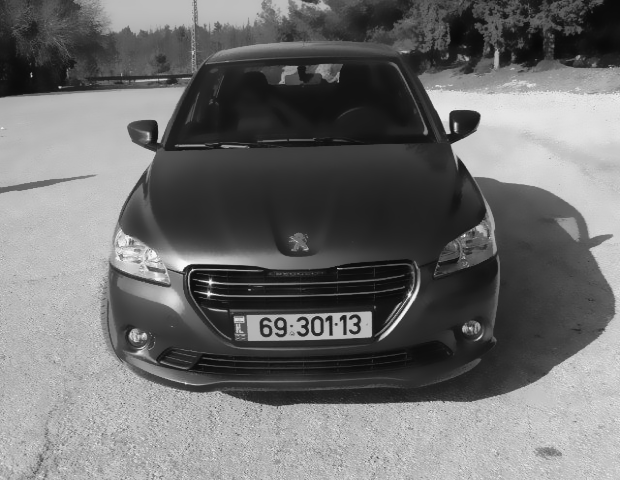




Grey scale image - Canny edge detector:


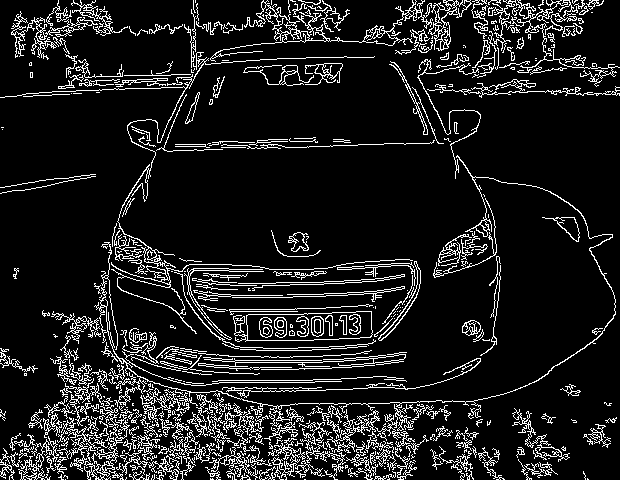




License plate:


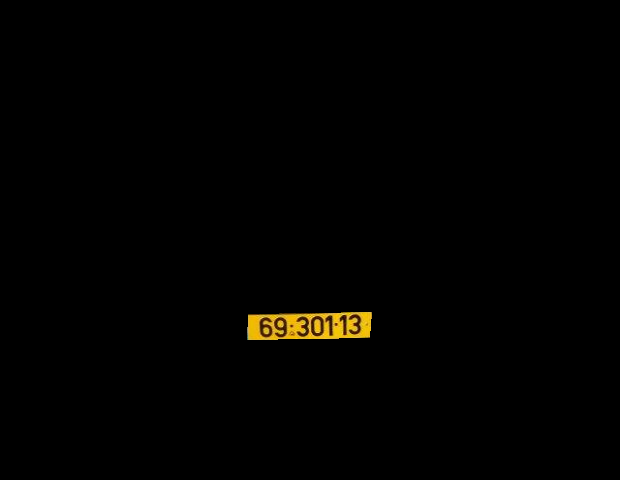




Cropped license plate:





OCR output: 930113


In [26]:
evaluate(
    img_name=IMG1,
    solution=SecondLicencePlateLocator,
    regex_pattern=r'[^0-9]',
    debug=True
)

#### Sample 2

Original image:


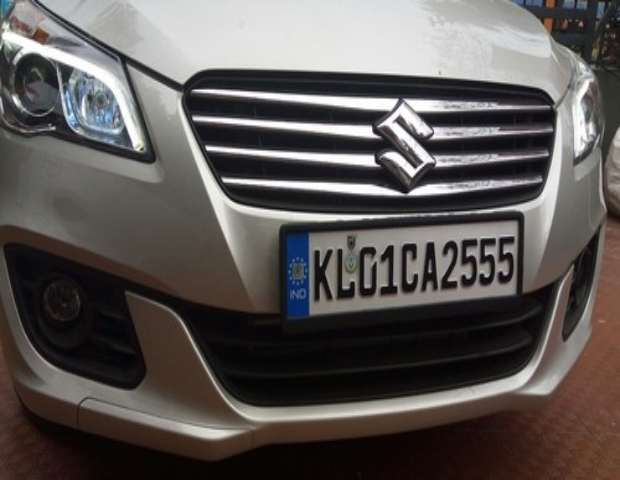




Gray scale image:


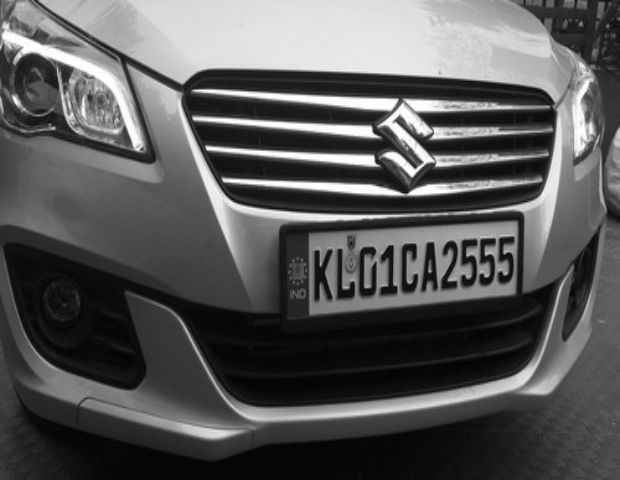




Grey scale image - bilateral filter:


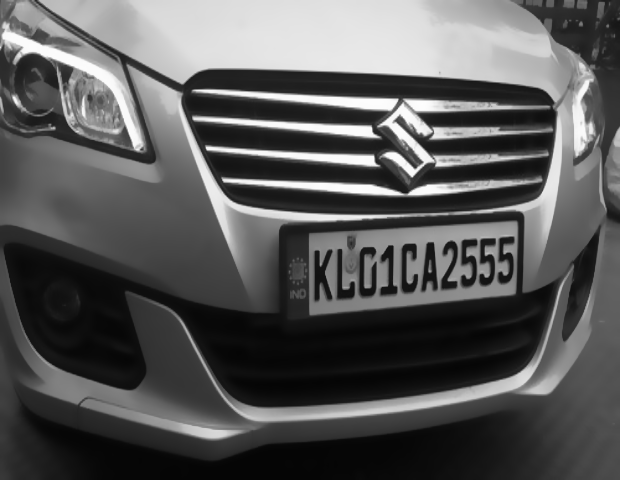




Grey scale image - Canny edge detector:


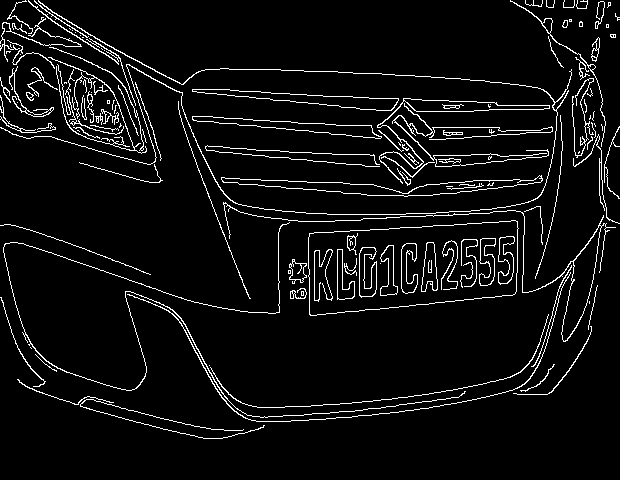




License plate:


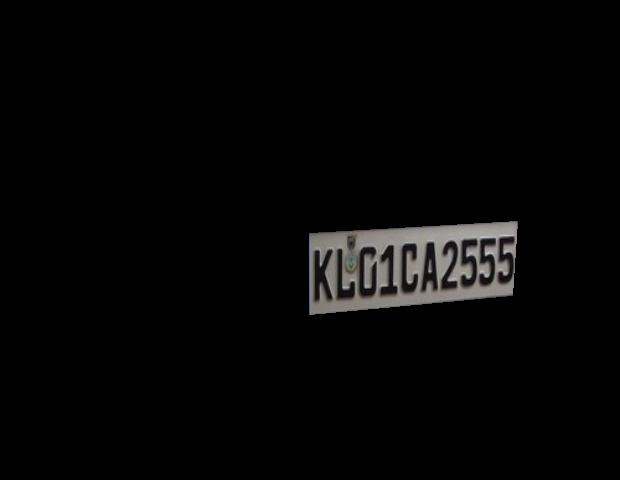




Cropped license plate:


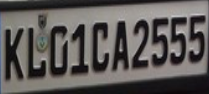




OCR output: KLG1A2555


In [27]:
evaluate(
    img_name=IMG2,
    solution=SecondLicencePlateLocator,
    regex_pattern=r'[^a-zA-Z0-9]',
    debug=True
)

#### Sample 3

Original image:


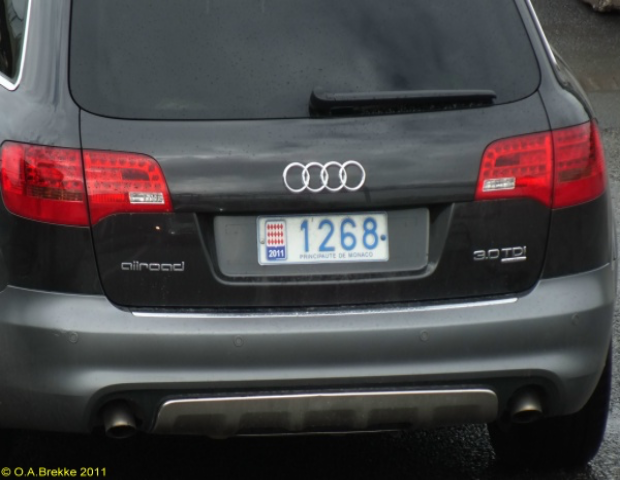




Gray scale image:


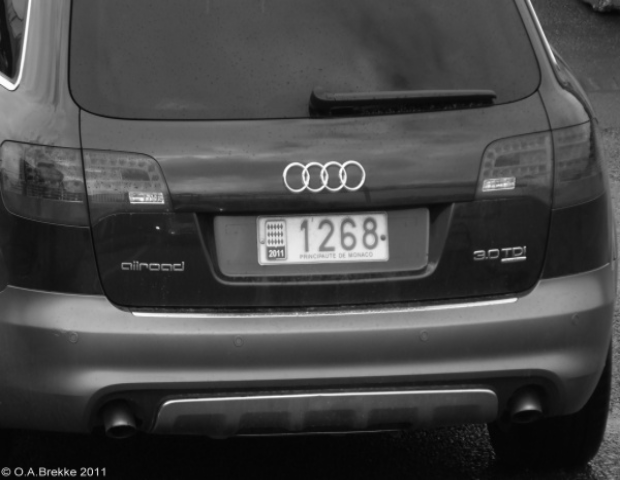




Grey scale image - bilateral filter:


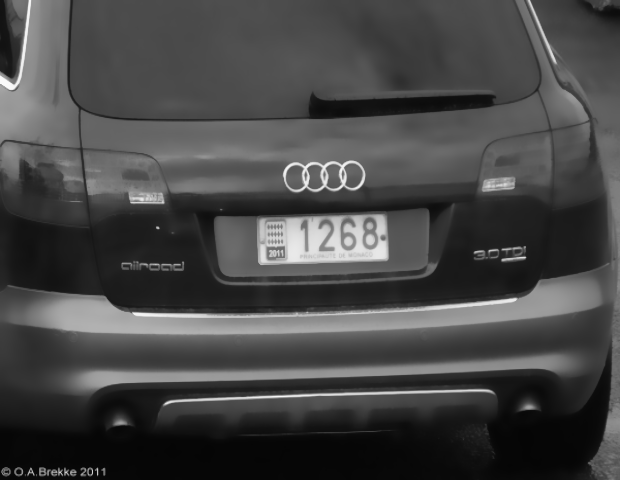




Grey scale image - Canny edge detector:


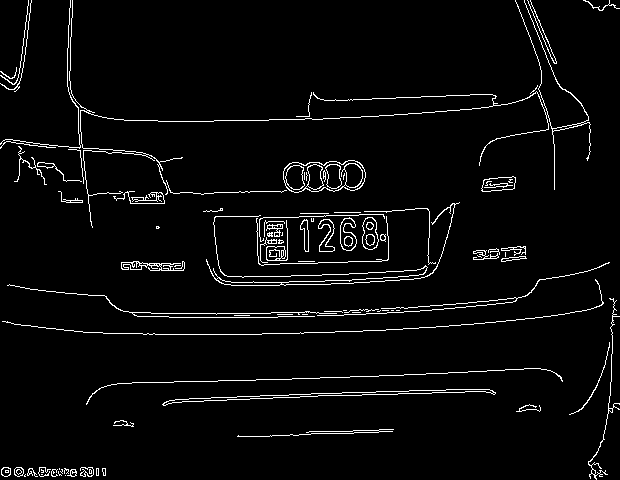




License plate:


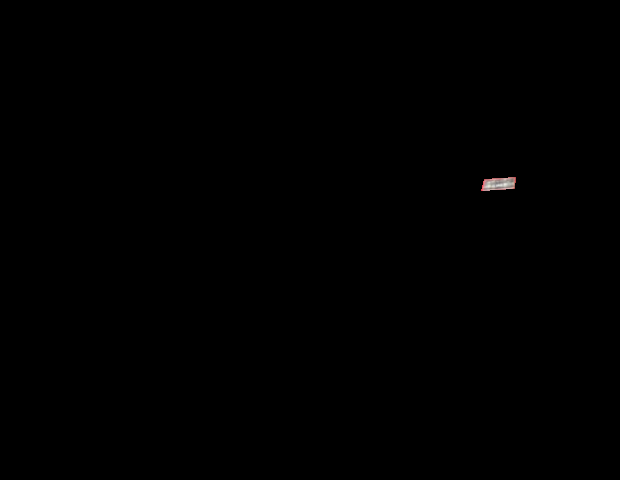




Cropped license plate:





OCR output: 


In [28]:
evaluate(
    img_name=IMG3,
    solution=SecondLicencePlateLocator,
    regex_pattern=r'[^0-9]',
    debug=True
)

## Third solution (My solution)

###  Implementation

In [29]:
class ThirdLicencePlateLocator:
    def __init__(self, img: str, minAR: int, maxAR: int, debug: bool = True):
        """ Detect license plate location in the image

        Args:
          img: Image path to extract license plate from.
          debug: A flag to indicate whether we should display intermediate results in our image processing pipeline.
        """
        # Resize the image to the required size and then grayscale it.
        self.img_rgb = cv2.resize(cv2.imread(img), (620, 480))
        self.img_gray = cv2.cvtColor(self.img_rgb, cv2.COLOR_BGR2GRAY)
        self.minAR = minAR
        self.maxAR = maxAR
        self.debug = debug

    def _locate_license_plate_candidates(self, keep=5) -> List[np.ndarray]:
        """ Find the license plate candidate contours in an image

        Args:
          keep: Return up to this many sorted license plate candidate contours

        Return:
          list: Contours candidate.
        """
        debug_imshow(self.img_rgb, "Original image", self.debug)
        debug_imshow(self.img_gray, "Gray scale image", self.debug)

        # Blur image 
        blur = cv2.GaussianBlur(self.img_gray, (5,5),0)

        # Find light regions
        ret,thresh = cv2.threshold(blur,150,255,cv2.THRESH_TRUNC)
        debug_imshow(thresh, "After thresholding", self.debug)

        # Find edges
        edges = cv2.Canny(thresh,100,200)
        debug_imshow(edges, "Found edges", self.debug)

        # Dialation
        dilation = cv2.dilate(edges,(9,9),iterations = 1)
        debug_imshow(edges, "Dilate", self.debug)

        # Find contours
        contours, hierarchy = cv2.findContours(dilation, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        img = cv2.drawContours(self.img_rgb.copy(), contours, -1, (0,255,0), 3)
        debug_imshow(img, "Found contours", self.debug)

        return contours

    def _locate_license_plate(self, candidates: List[np.ndarray]) -> np.ndarray:
        lp_contours = []
        for cnt in candidates:
          peri = cv2.arcLength(cnt, True)
          approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)
          # Filter contours which format rectangle
          if len(approx) == 4:
            (x, y, w, h) = cv2.boundingRect(cnt)
            ar = float(h) / w
            # Filter rectangle which has aspect ratio that look like license plate
            if  self.minAR < ar < self.maxAR:
              lp_contours.append(approx)
        img = cv2.drawContours(self.img_rgb.copy(), lp_contours , -1, (0,255,0), 3)
        debug_imshow(img, "Filter rectangle which look like license plate", self.debug)

        # Masking the part other than the number plate.
        mask = np.zeros(self.img_gray.shape, np.uint8)
        new_image = cv2.drawContours(mask, [lp_contours[0]], 0, 255, -1, )
        new_image = cv2.bitwise_and(self.img_rgb, self.img_rgb, mask=mask)
        debug_imshow(new_image, "License plate", self.debug)

        # Crop only license plate from the image.
        (x, y) = np.where(mask == 255)
        (topx, topy) = (np.min(x), np.min(y))
        (bottomx, bottomy) = (np.max(x), np.max(y))
        cropped = self.img_rgb[topx:bottomx + 1, topy:bottomy + 1]
        debug_imshow(cropped, "Cropped license plate", self.debug)

        # Emphasize text
        kernel = np.ones((3,3),np.uint8)
        dilation = cv2.dilate(cropped, kernel, iterations = 1)
        debug_imshow(dilation, "Cropped license plate", self.debug)

        return dilation


    def locate(self) -> np.ndarray:
        """ Locate license plat in the image.

        Returns:
            np.ndarray: Sliced image of license plate
        """
        candidates = self._locate_license_plate_candidates()

        return self._locate_license_plate(candidates)

### Evaluation

#### Sample 1

Original image:


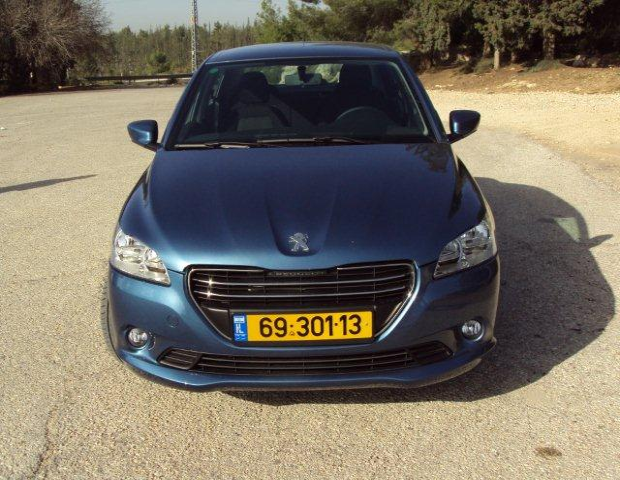




Gray scale image:


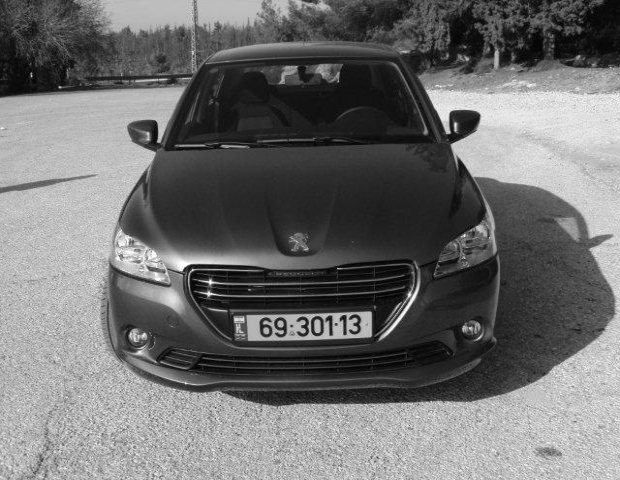




After thresholding:


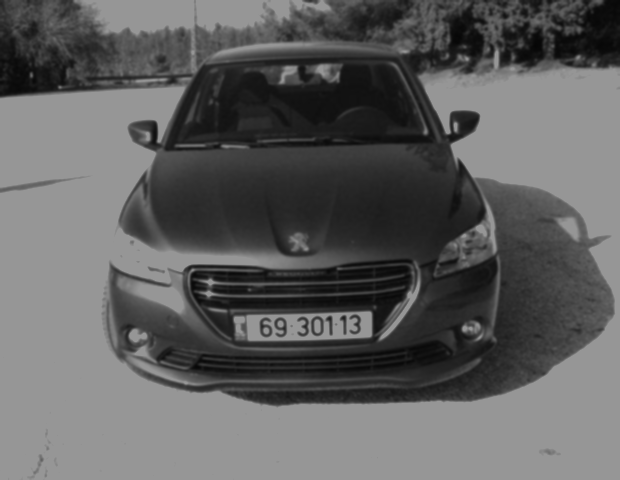




Found edges:


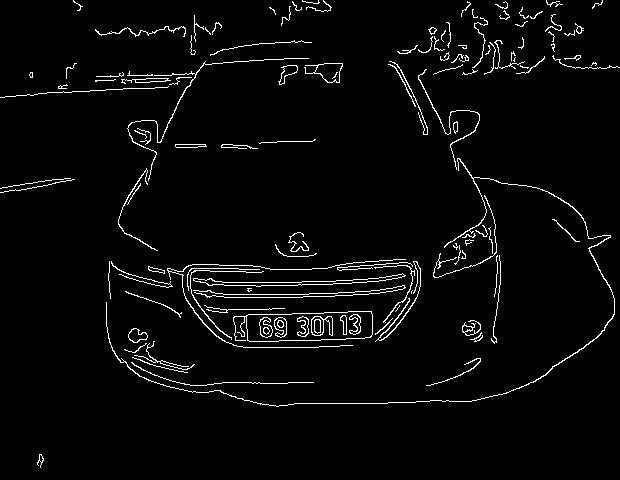




Dilate:


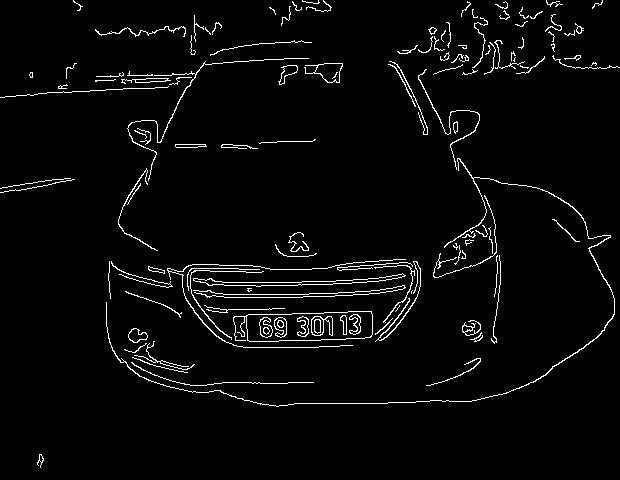




Found contours:


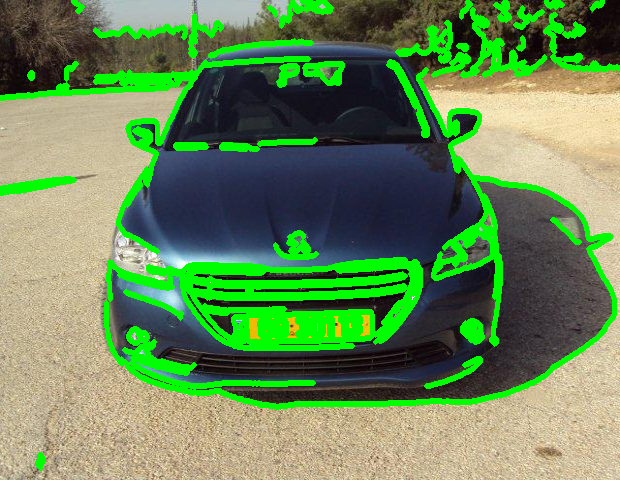




Filter rectangle which look like license plate:


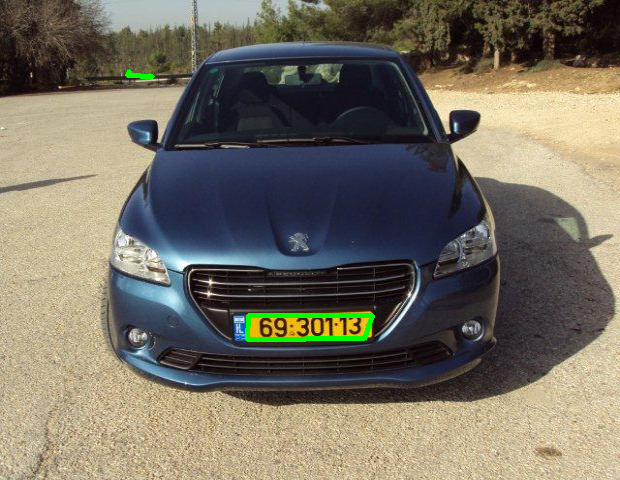




License plate:


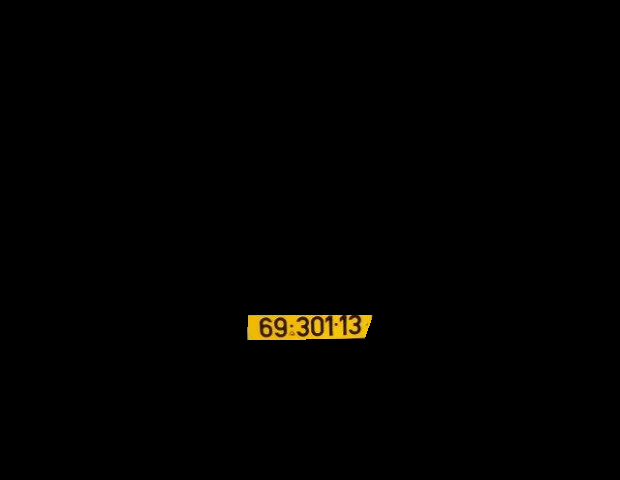




Cropped license plate:





Cropped license plate:





OCR output: 6930113


In [30]:
evaluate(
    img_name=IMG1,
    solution=ThirdLicencePlateLocator,
    minAR=0.23,
    maxAR=0.25,
    regex_pattern=r'[^0-9]',
    debug=True
)

#### Sample 2

Original image:


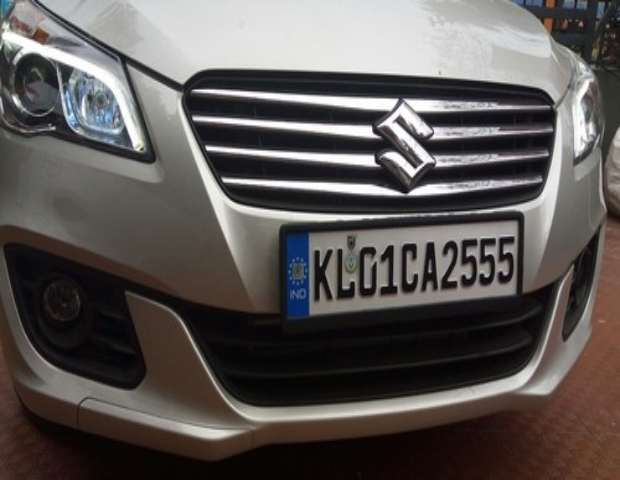




Gray scale image:


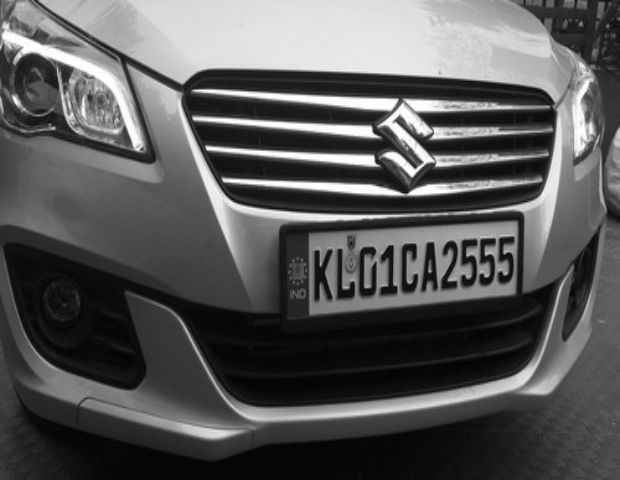




After thresholding:


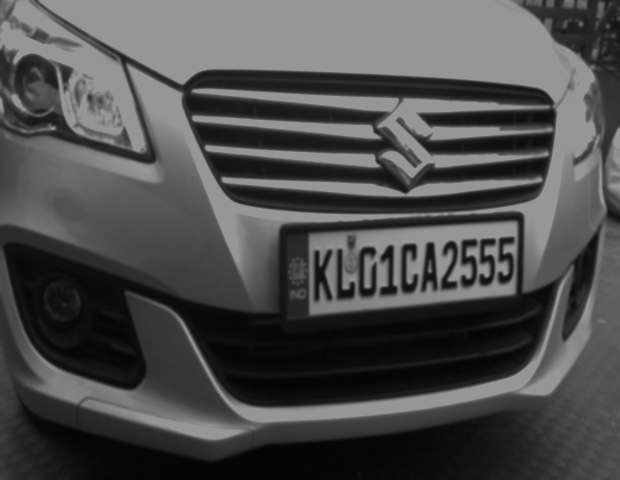




Found edges:


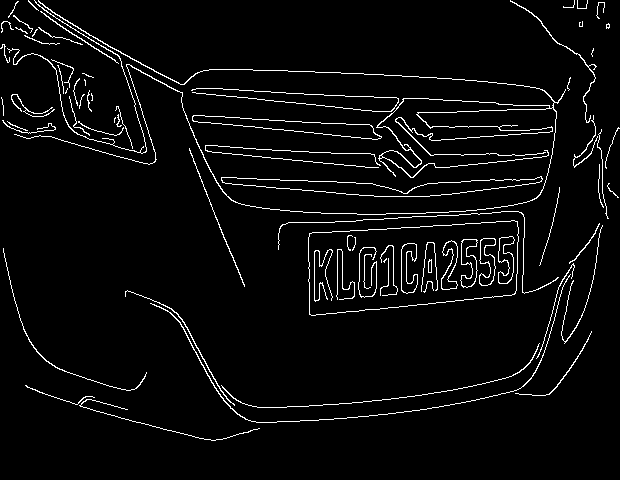




Dilate:


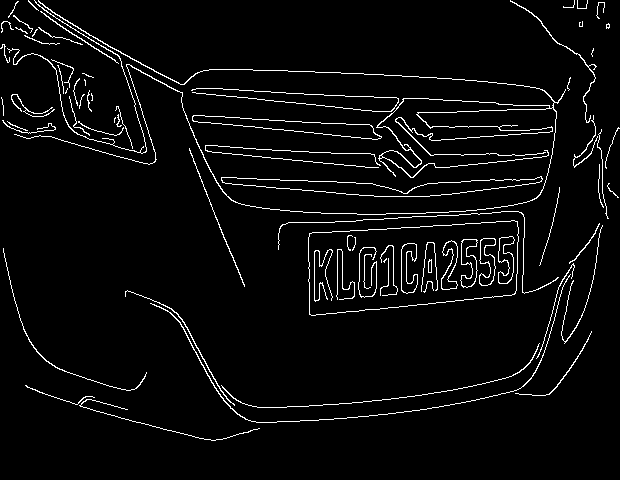




Found contours:


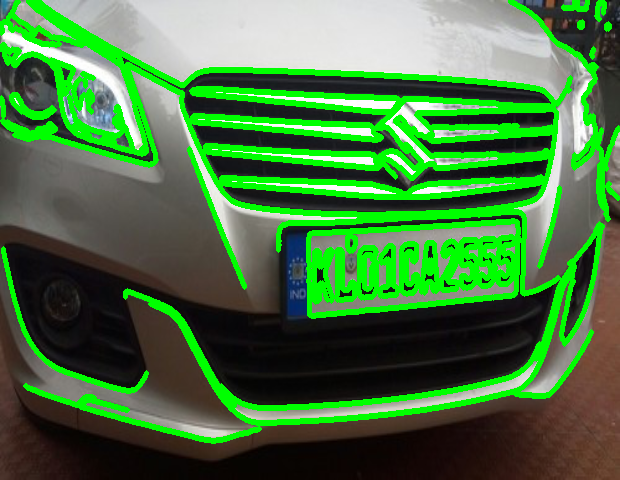




Filter rectangle which look like license plate:


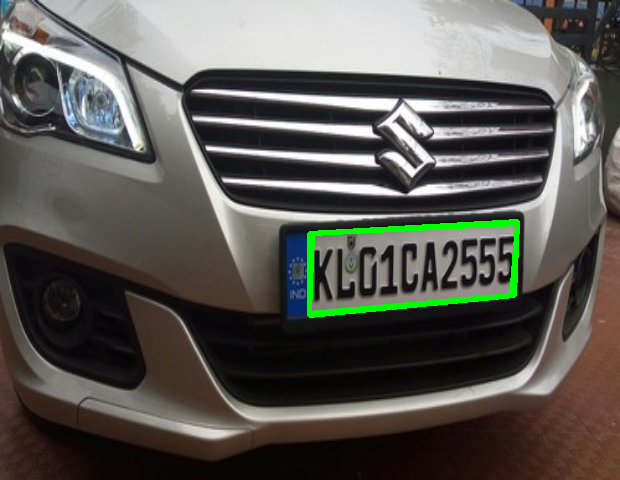




License plate:


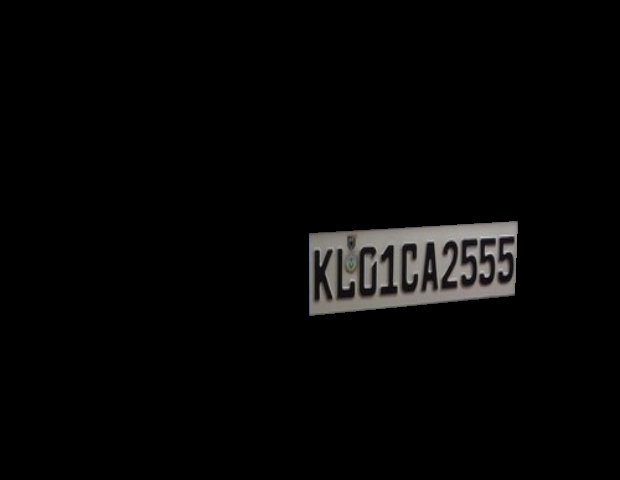




Cropped license plate:


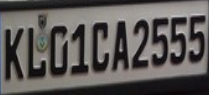




Cropped license plate:


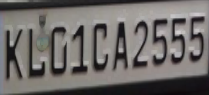




OCR output: KILG10A2555


In [31]:
evaluate(
    img_name=IMG2,
    solution=ThirdLicencePlateLocator,
    regex_pattern=r'[^a-zA-Z0-9]',
    minAR=0.25,
    maxAR=0.5,
    debug=True
)

#### Sample 3

Original image:


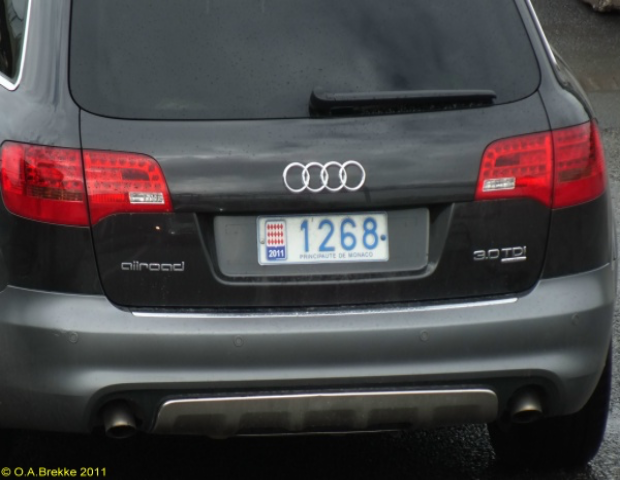




Gray scale image:


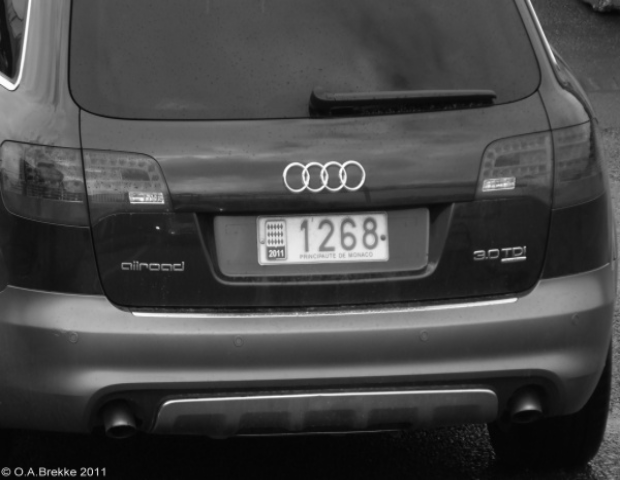




After thresholding:


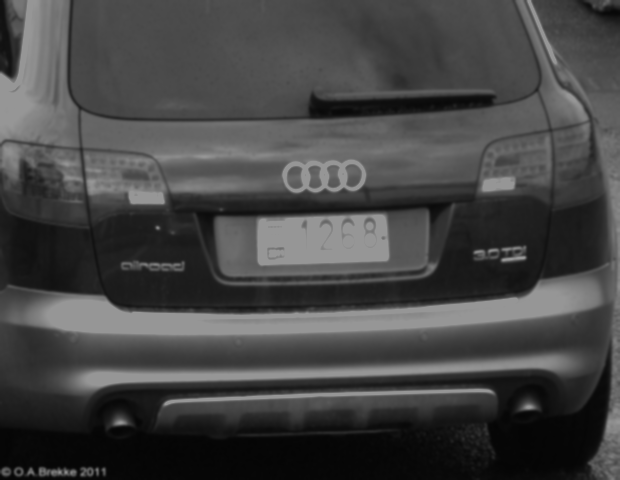




Found edges:


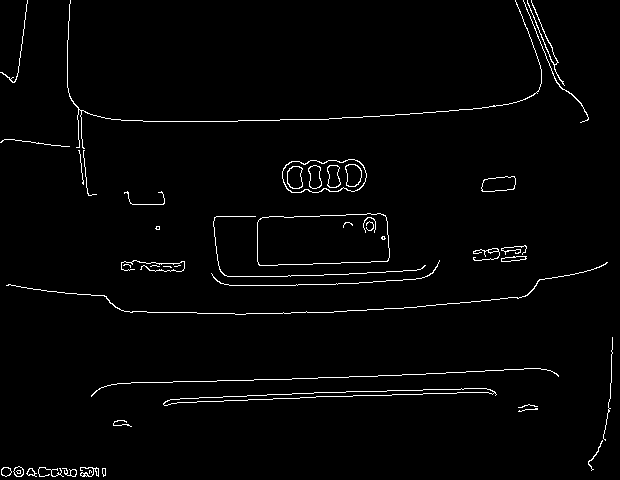




Dilate:


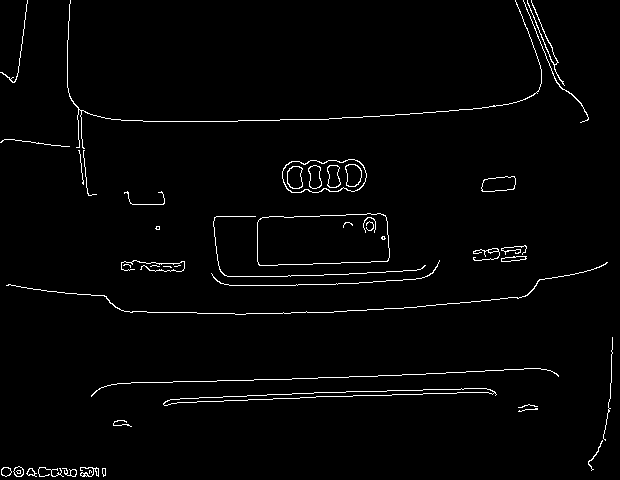




Found contours:


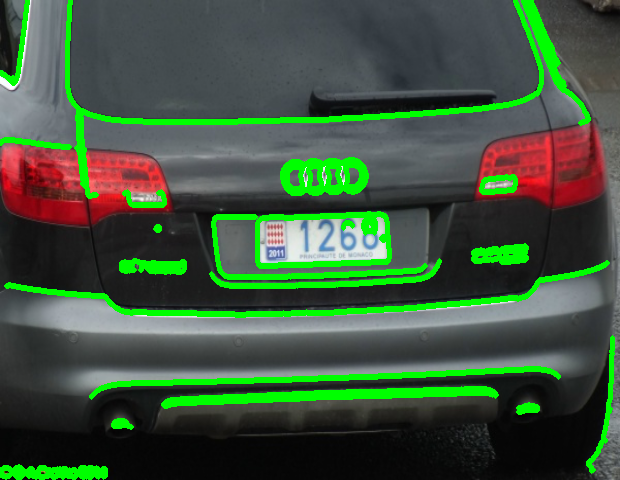




Filter rectangle which look like license plate:


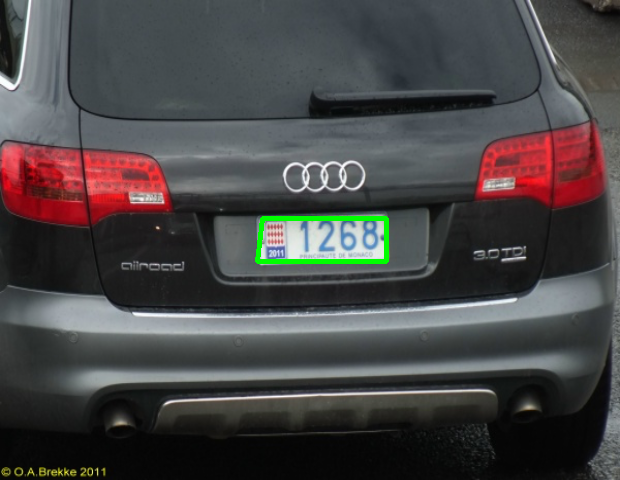




License plate:


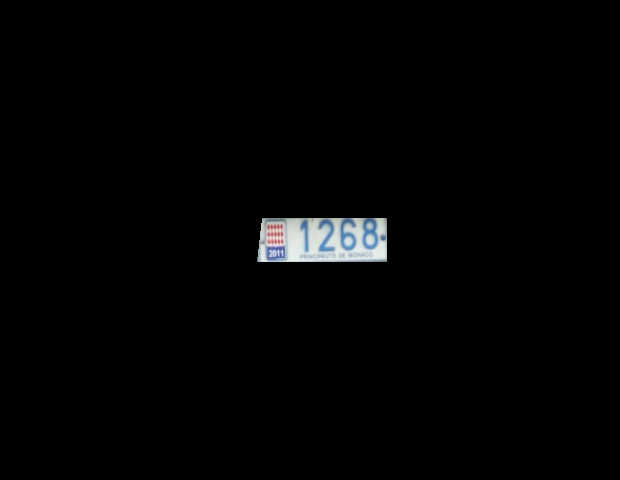




Cropped license plate:


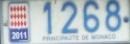




Cropped license plate:


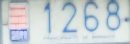




OCR output: 1206


In [32]:
evaluate(
    img_name=IMG3,
    solution=ThirdLicencePlateLocator,
    minAR=0.35,
    maxAR=0.4,
    regex_pattern=r'[^0-9]',
    debug=True
)